# Self-Supervised and Semi-Self-Supervised Learning on Real Fixation ERP Images

This notebook evaluates contrastive self-supervised learning and a confidence-thresholded semi-supervised self-training extension on the same real eye-tracking ERP dataset that is already used in the supervised experiments.

The workflow keeps the existing binary labels for the downstream classification task and compares six model variants under the same **mod-4 split** and **5-fold grouped cross-validation** setup:

- `supervised_resnet18`: standard supervised training from scratch.
- `ssl_linear_probe_trainfold_images`: self-supervised pretraining on the labeled training-fold ERP images, but without using labels during pretraining.
- `ssl_finetune_trainfold_images`: same encoder initialization, followed by full fine-tuning.
- `ssl_linear_probe_same_dataset_mod4_pool`: self-supervised pretraining on the larger mod-4 pool from the same dataset, restricted to training groups of the current fold.
- `ssl_finetune_same_dataset_mod4_pool`: same encoder initialization, followed by full fine-tuning.
- `semi_ssl_pseudolabel_same_dataset_mod4_pool`: semi-supervised self-training with confidence-thresholded pseudo-labels from the mod-4 pool after the self-supervised teacher has been fine-tuned.

All code comments and notebook text stay in English so the experiment remains easy to compare with the existing Week 15 and model-test notebooks.


## References and Design Choice

The implementation keeps the existing SimCLR-style contrastive pretraining and adds a simple confidence-thresholded pseudo-label stage for the semi-supervised extension.

Primary references used for the design:

- SimCLR: Chen et al., 2020. https://proceedings.mlr.press/v119/chen20j.html
- SimCLRv2 / self-training motivation after SSL pretraining: Chen et al., 2020. https://arxiv.org/abs/2006.10029
- FixMatch / confidence-thresholded pseudo-labeling: Sohn et al., 2020. https://openreview.net/forum?id=bleIdqV_-JY
- Noisy Student / self-training motivation: Xie et al., 2020. https://openaccess.thecvf.com/content_CVPR_2020/html/Xie_Self-Training_With_Noisy_Student_Improves_ImageNet_Classification_CVPR_2020_paper.html
- EEG-specific contrastive representation learning reference: Mohsenvand et al., 2020. https://proceedings.mlr.press/v136/mohsenvand20a.html
- Metalhead ResNet API: https://fluxml.ai/Metalhead.jl/stable/api/resnet/

Design choice used here:

1. Keep the downstream target identical to the existing real-data binary classification task.
2. Use the same real fixation dataset and the same label merge logic as the supervised experiments.
3. Keep the **mod-4 split** and the **grouped 5-fold CV** so results stay comparable.
4. Treat the fold-local training images as unlabeled during contrastive pretraining.
5. Add a larger fold-local unlabeled pool from the same dataset via the full mod-4 expansion.
6. Add one explicit semi-supervised stage: pseudo-label the extra unlabeled mod-4 images with a confidence threshold and continue training a student model on labeled plus pseudo-labeled data.


In [1]:
using InteractiveUtils
versioninfo()


Julia Version 1.12.3
Commit 966d0af0fdf (2025-12-15 11:20 UTC)
Build Info:
  Official https://julialang.org release
Platform Info:
  OS: Linux (x86_64-linux-gnu)
  CPU: 16 × AMD Ryzen 7 7800X3D 8-Core Processor
  WORD_SIZE: 64
  LLVM: libLLVM-18.1.7 (ORCJIT, znver4)
  GC: Built with stock GC
Threads: 16 default, 1 interactive, 16 GC (on 16 virtual cores)
Environment:
  JULIA_NUM_THREADS = 16


In [2]:
import Pkg

# Keep notebook startup stable and deterministic enough for repeated runs.
ENV["JULIA_PKG_PRECOMPILE_AUTO"] = "0"
ENV["JULIA_NUM_PRECOMPILE_TASKS"] = "1"

Pkg.activate(joinpath(pwd(), "..", "model_test"))
Pkg.instantiate()

using CSV
using CairoMakie
using CUDA
using DataFrames
using Dates
using Flux
using Metalhead
using Statistics

include(joinpath(pwd(), "..", "utils", "erp_ssl_experiment_utils.jl"))
using .ERPSSLExperimentUtils

if CUDA.functional()
    CUDA.allowscalar(false)
end

println("Flux version: ", Base.pkgversion(Flux))
println("Metalhead version: ", Base.pkgversion(Metalhead))
println("CUDA functional: ", CUDA.functional())
println("Notebook directory: ", pwd())
println("Started at: ", now())


  Activating project at `~/Dokumente/BA2/notebooks/model_test`


Flux version: 0.16.9
Metalhead version: 0.9.6
CUDA functional: true
Notebook directory: /home/benjamin/Dokumente/BA2/notebooks/week_18
Started at: 2026-04-09T14:37:34.185


In [3]:
# Use time-based seeds as requested so each run is clearly traceable.
GLOBAL_SEED = Int(mod(time_ns(), typemax(Int) - 10))
NO_CLASS_PICK_SEED = GLOBAL_SEED + 1
FOLD_SEED = GLOBAL_SEED + 2
EXPERIMENT_SEED = GLOBAL_SEED + 3

seed_df = DataFrame(
    name = ["global_seed", "no_class_pick_seed", "fold_seed", "experiment_seed"],
    value = [GLOBAL_SEED, NO_CLASS_PICK_SEED, FOLD_SEED, EXPERIMENT_SEED],
)

seed_df


Row,name,value
,String,Int64
1,global_seed,2904865133268
2,no_class_pick_seed,2904865133269
3,fold_seed,2904865133270
4,experiment_seed,2904865133271


In [4]:
# The preprocessing stays aligned with the established ERP reference pipeline.
IMAGE_SIZE = (64, 64)
LOWPASS_SIGMA = 75.0f0
LOWPASS_KERNEL_SIZE = (21, 21)
FILTER_BORDER = "reflect"
K_FOLDS = 5

ctx = load_real_ssl_context(
    pwd();
    target_size = IMAGE_SIZE,
    low_pass_sigma = LOWPASS_SIGMA,
    lowpass_kernel_size = LOWPASS_KERNEL_SIZE,
    filter_border = FILTER_BORDER,
    positive_split_k = 4,
    no_class_split_k = 4,
    ssl_pool_split_k = 4,
    no_class_pick_seed = NO_CLASS_PICK_SEED,
    fold_seed = FOLD_SEED,
    k_folds = K_FOLDS,
)

println("Supervised tensor size: ", size(ctx.X_supervised))
println("Supervised samples: ", nrow(ctx.supervised_df))
println("Semi-SSL pool samples: ", nrow(ctx.ssl_pool_df))
println("Unique supervised groups: ", length(unique(ctx.supervised_df.group_id)))
println("Unique semi-SSL groups: ", length(unique(ctx.ssl_pool_df.group_id)))


Supervised tensor size: (64, 64, 1, 644)
Supervised samples: 644
Semi-SSL pool samples: 2000
Unique supervised groups: 500
Unique semi-SSL groups: 500


In [5]:
plan_overview_df = DataFrame(
    dataset = ["supervised_cv", "semi_ssl_pool"],
    n_samples = [nrow(ctx.supervised_df), nrow(ctx.ssl_pool_df)],
    n_groups = [length(unique(ctx.supervised_df.group_id)), length(unique(ctx.ssl_pool_df.group_id))],
    n_positive = [sum(ctx.supervised_df.binary_label .== 1), sum(ctx.ssl_pool_df.binary_label .== 1)],
    n_negative = [sum(ctx.supervised_df.binary_label .== 0), sum(ctx.ssl_pool_df.binary_label .== 0)],
)

supervised_sort_df = combine(
    groupby(ctx.supervised_df, [:binary_label, :sort_var]),
    nrow => :count,
)
sort!(supervised_sort_df, [:binary_label, :sort_var])

(
    plan_overview_df = plan_overview_df,
    fold_stats_df = ctx.fold_stats_df,
    fold_sort_stats_df = ctx.fold_sort_stats_df,
    supervised_sort_df = supervised_sort_df,
)


(plan_overview_df = 2×5 DataFrame
 Row │ dataset        n_samples  n_groups  n_positive  n_negative 
     │ String         Int64      Int64     Int64       Int64      
─────┼────────────────────────────────────────────────────────────
   1 │ supervised_cv        644       500         192         452
   2 │ semi_ssl_pool       2000       500         192        1808, fold_stats_df = 5×4 DataFrame
 Row │ fold   n_val  n_pos  n_neg 
     │ Int64  Int64  Int64  Int64 
─────┼────────────────────────────
   1 │     1    131     38     93
   2 │     2    131     38     93
   3 │     3    128     38     90
   4 │     4    128     39     89
   5 │     5    126     39     87, fold_sort_stats_df = 30×3 DataFrame
 Row │ fold   sort_var          count 
     │ Int64  String            Int64 
─────┼────────────────────────────────
   1 │     1  duration             39
   2 │     1  fix_avgpos_x         17
   3 │     1  fix_avgpupilsize     17
   4 │     1  fix_type             17
   5 │     1  latency

## Experiment Setup

The comparison uses one common ResNet-18 classifier backbone for all downstream evaluations.

- `supervised_resnet18` is the direct baseline.
- `trainfold_images` means the encoder was pretrained only on the current fold's training images while ignoring labels.
- `same_dataset_mod4_pool` means the encoder was pretrained on a larger unlabeled mod-4 pool from the same dataset, still restricted to the training groups of the current fold.
- `linear_probe` freezes the encoder and only learns the final binary head.
- `finetune` updates the whole classifier after the contrastive pretraining stage.
- `pseudo_label_finetune` adds a second student-training stage with confidence-thresholded pseudo-labels from the extra mod-4 pool.

This keeps the split logic clean: no validation groups are ever used inside pretraining or pseudo-label selection for the fold that evaluates them.


In [6]:
# Keep defaults small enough to run end-to-end while still exercising the whole workflow.
SSL_BATCHSIZE = CUDA.functional() ? 64 : 8
CLASSIFIER_BATCHSIZE = CUDA.functional() ? 32 : 8

SSL_EPOCHS = CUDA.functional() ? 2 : 1
BASELINE_EPOCHS = CUDA.functional() ? 2 : 1
PROBE_EPOCHS = CUDA.functional() ? 2 : 1
FINETUNE_EPOCHS = CUDA.functional() ? 2 : 1
PSEUDO_LABEL_EPOCHS = CUDA.functional() ? 2 : 1

SSL_LR = 1f-3
BASELINE_LR = 1f-3
PROBE_LR = 2f-3
FINETUNE_LR = 3f-4
PSEUDO_LABEL_LR = 3f-4
SSL_TEMPERATURE = 0.10f0
PSEUDO_LABEL_THRESHOLD = 0.90f0
PSEUDO_LABEL_MIN_KEEP = 32
SHOW_EPOCH_LOGS = false

experiment_config_df = DataFrame(
    parameter = [
        "ssl_batchsize", "classifier_batchsize",
        "ssl_epochs", "baseline_epochs", "probe_epochs", "finetune_epochs", "pseudo_label_epochs",
        "ssl_lr", "baseline_lr", "probe_lr", "finetune_lr", "pseudo_label_lr", "ssl_temperature",
        "pseudo_label_threshold", "pseudo_label_min_keep",
    ],
    value = [
        string(SSL_BATCHSIZE), string(CLASSIFIER_BATCHSIZE),
        string(SSL_EPOCHS), string(BASELINE_EPOCHS), string(PROBE_EPOCHS), string(FINETUNE_EPOCHS), string(PSEUDO_LABEL_EPOCHS),
        string(SSL_LR), string(BASELINE_LR), string(PROBE_LR), string(FINETUNE_LR), string(PSEUDO_LABEL_LR), string(SSL_TEMPERATURE),
        string(PSEUDO_LABEL_THRESHOLD), string(PSEUDO_LABEL_MIN_KEEP),
    ],
)

experiment_config_df


Row,parameter,value
,String,String
1,ssl_batchsize,64
2,classifier_batchsize,32
3,ssl_epochs,2
4,baseline_epochs,2
5,probe_epochs,2
6,finetune_epochs,2
7,pseudo_label_epochs,2
8,ssl_lr,0.001
9,baseline_lr,0.001


In [7]:
ssl_cv_run = run_ssl_cv(
    ctx.supervised_df,
    ctx.ssl_pool_df,
    ctx.X_supervised,
    ctx.y_binary,
    ctx.group_ids,
    ctx.fold_val_indices;
    ssl_batchsize = SSL_BATCHSIZE,
    ssl_epochs = SSL_EPOCHS,
    ssl_lr = SSL_LR,
    ssl_temperature = SSL_TEMPERATURE,
    baseline_epochs = BASELINE_EPOCHS,
    baseline_lr = BASELINE_LR,
    probe_epochs = PROBE_EPOCHS,
    probe_lr = PROBE_LR,
    finetune_epochs = FINETUNE_EPOCHS,
    finetune_lr = FINETUNE_LR,
    pseudo_label_threshold = PSEUDO_LABEL_THRESHOLD,
    pseudo_label_min_keep = PSEUDO_LABEL_MIN_KEEP,
    pseudo_label_epochs = PSEUDO_LABEL_EPOCHS,
    pseudo_label_lr = PSEUDO_LABEL_LR,
    classifier_batchsize = CLASSIFIER_BATCHSIZE,
    image_size = IMAGE_SIZE,
    seed = EXPERIMENT_SEED,
    show_epoch_logs = SHOW_EPOCH_LOGS,
)

ssl_cv_df = ssl_cv_run.cv_df
ssl_summary_df = ssl_cv_run.summary_df
ssl_prediction_df = ssl_cv_run.prediction_df
ssl_runs = ssl_cv_run.ssl_runs

println("Finished fold-level runs: ", nrow(ssl_cv_df))
println("Finished summary rows: ", nrow(ssl_summary_df))
println("Finished prediction rows: ", nrow(ssl_prediction_df))
ssl_summary_df


Finished fold-level runs: 30
Finished summary rows: 6
Finished prediction rows: 3864


Row,experiment,pretrain_source,transfer_mode,accuracy_mean,accuracy_std,balanced_accuracy_mean,balanced_accuracy_std,macro_f1_mean,macro_f1_std,precision_mean,recall_mean,ssl_pretrain_time_mean_s,classifier_train_time_mean_s,val_time_mean_s,total_time_mean_s,n_ssl_images_mean,n_pseudo_available_mean,n_pseudo_selected_mean,pseudo_confidence_threshold,params_n
,String,String,String,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float32,Int64
1,semi_ssl_pseudolabel_same_dataset_mod4_pool,same_dataset_mod4_pool,pseudo_label_finetune,0.88045,0.0293582,0.836602,0.0490088,0.849436,0.0421512,0.869834,0.836602,1.31583,1.33798,0.365894,8.4586,1638.4,1123.2,823.2,0.9,11171266
2,ssl_finetune_same_dataset_mod4_pool,same_dataset_mod4_pool,finetune,0.855885,0.0689069,0.77604,0.129562,0.787528,0.137992,0.883546,0.77604,1.31583,0.293709,0.342375,1.95192,1638.4,0.0,0.0,0.0,11171266
3,ssl_finetune_trainfold_images,trainfold_images,finetune,0.80587,0.0287332,0.67561,0.0479904,0.696766,0.0620669,0.881274,0.67561,3.6192,1.20112,0.390924,5.21125,515.2,0.0,0.0,0.0,11171266
4,ssl_linear_probe_same_dataset_mod4_pool,same_dataset_mod4_pool,linear_probe,0.70019,0.00910256,0.504971,0.011115,0.42815,0.0357105,0.396437,0.504971,1.31583,0.0695635,0.309122,1.69452,1638.4,0.0,0.0,0.0,11171266
5,supervised_resnet18,none,supervised,0.623627,0.178469,0.5,3.34221e-16,0.377037,0.0802682,0.311814,0.5,0.0,9.63992,0.409851,10.0498,0.0,0.0,0.0,0.0,11171266
6,ssl_linear_probe_trainfold_images,trainfold_images,linear_probe,0.608889,0.1635,0.494546,0.0192756,0.388415,0.0719781,0.430426,0.494546,3.6192,0.128712,0.364095,4.11201,515.2,0.0,0.0,0.0,11171266


In [8]:
cv_display_df = sort(
    select(
        ssl_cv_df,
        :fold,
        :experiment,
        :pretrain_source,
        :transfer_mode,
        :n_train,
        :n_val,
        :n_ssl_images,
        :accuracy,
        :balanced_accuracy,
        :macro_f1,
        :ssl_pretrain_time_s,
        :classifier_train_time_s,
        :total_time_s,
    ),
    [:experiment, :fold],
)

cv_display_df


Row,fold,experiment,pretrain_source,transfer_mode,n_train,n_val,n_ssl_images,accuracy,balanced_accuracy,macro_f1,ssl_pretrain_time_s,classifier_train_time_s,total_time_s
,Int64,String,String,String,Int64,Int64,Int64,Float64,Float64,Float64,Float64,Float64,Float64
1,1,semi_ssl_pseudolabel_same_dataset_mod4_pool,same_dataset_mod4_pool,pseudo_label_finetune,513,131,1628,0.89313,0.862479,0.868171,1.29172,1.22767,6.23368
2,2,semi_ssl_pseudolabel_same_dataset_mod4_pool,same_dataset_mod4_pool,pseudo_label_finetune,513,131,1628,0.870229,0.807442,0.829545,1.14097,1.41938,6.16866
3,3,semi_ssl_pseudolabel_same_dataset_mod4_pool,same_dataset_mod4_pool,pseudo_label_finetune,516,128,1640,0.835938,0.769298,0.787728,1.41456,1.54311,10.1842
4,4,semi_ssl_pseudolabel_same_dataset_mod4_pool,same_dataset_mod4_pool,pseudo_label_finetune,516,128,1644,0.914062,0.894987,0.897845,1.29699,1.35192,11.5926
5,5,semi_ssl_pseudolabel_same_dataset_mod4_pool,same_dataset_mod4_pool,pseudo_label_finetune,518,126,1652,0.888889,0.848806,0.863889,1.43493,1.14783,8.11389
6,1,ssl_finetune_same_dataset_mod4_pool,same_dataset_mod4_pool,finetune,513,131,1628,0.854962,0.773345,0.801468,1.29172,0.286616,2.04426
7,2,ssl_finetune_same_dataset_mod4_pool,same_dataset_mod4_pool,finetune,513,131,1628,0.847328,0.760187,0.78871,1.14097,0.295196,1.76531
8,3,ssl_finetune_same_dataset_mod4_pool,same_dataset_mod4_pool,finetune,516,128,1640,0.75,0.578947,0.560892,1.41456,0.295975,2.02334
9,4,ssl_finetune_same_dataset_mod4_pool,same_dataset_mod4_pool,finetune,516,128,1644,0.890625,0.834918,0.859825,1.29699,0.289348,1.89913


In [9]:
learning_regime(source::AbstractString, transfer_mode::AbstractString) =
    transfer_mode == "pseudo_label_finetune" ? "semi_supervised_self_training" :
    source == "none" ? "supervised" :
    source == "trainfold_images" ? "self_supervised" :
    source == "same_dataset_mod4_pool" ? "semi_self_supervised" : "unknown"

summary_rank_df = copy(ssl_summary_df)
summary_rank_df.learning_regime = learning_regime.(summary_rank_df.pretrain_source, summary_rank_df.transfer_mode)

baseline_balanced_accuracy = only(summary_rank_df[summary_rank_df.experiment .== "supervised_resnet18", :balanced_accuracy_mean])
baseline_macro_f1 = only(summary_rank_df[summary_rank_df.experiment .== "supervised_resnet18", :macro_f1_mean])

summary_rank_df.delta_balanced_accuracy = summary_rank_df.balanced_accuracy_mean .- baseline_balanced_accuracy
summary_rank_df.delta_macro_f1 = summary_rank_df.macro_f1_mean .- baseline_macro_f1

sort!(summary_rank_df, :balanced_accuracy_mean, rev = true)

select(
    summary_rank_df,
    :learning_regime,
    :experiment,
    :pretrain_source,
    :transfer_mode,
    :balanced_accuracy_mean,
    :balanced_accuracy_std,
    :macro_f1_mean,
    :macro_f1_std,
    :accuracy_mean,
    :delta_balanced_accuracy,
    :delta_macro_f1,
    :n_ssl_images_mean,
    :n_pseudo_selected_mean,
    :pseudo_confidence_threshold,
    :total_time_mean_s,
)


Row,learning_regime,experiment,pretrain_source,transfer_mode,balanced_accuracy_mean,balanced_accuracy_std,macro_f1_mean,macro_f1_std,accuracy_mean,delta_balanced_accuracy,delta_macro_f1,n_ssl_images_mean,n_pseudo_selected_mean,pseudo_confidence_threshold,total_time_mean_s
,String,String,String,String,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float32,Float64
1,semi_supervised_self_training,semi_ssl_pseudolabel_same_dataset_mod4_pool,same_dataset_mod4_pool,pseudo_label_finetune,0.836602,0.0490088,0.849436,0.0421512,0.88045,0.336602,0.472399,1638.4,823.2,0.9,8.4586
2,semi_self_supervised,ssl_finetune_same_dataset_mod4_pool,same_dataset_mod4_pool,finetune,0.77604,0.129562,0.787528,0.137992,0.855885,0.27604,0.410491,1638.4,0.0,0.0,1.95192
3,self_supervised,ssl_finetune_trainfold_images,trainfold_images,finetune,0.67561,0.0479904,0.696766,0.0620669,0.80587,0.17561,0.319729,515.2,0.0,0.0,5.21125
4,semi_self_supervised,ssl_linear_probe_same_dataset_mod4_pool,same_dataset_mod4_pool,linear_probe,0.504971,0.011115,0.42815,0.0357105,0.70019,0.00497076,0.0511132,1638.4,0.0,0.0,1.69452
5,supervised,supervised_resnet18,none,supervised,0.5,3.34221e-16,0.377037,0.0802682,0.623627,0.0,0.0,0.0,0.0,0.0,10.0498
6,self_supervised,ssl_linear_probe_trainfold_images,trainfold_images,linear_probe,0.494546,0.0192756,0.388415,0.0719781,0.608889,-0.0054544,0.0113785,515.2,0.0,0.0,4.11201


In [10]:
balanced_accuracy_overview_df = unstack(
    select(summary_rank_df, :learning_regime, :transfer_mode, :experiment, :balanced_accuracy_mean),
    [:learning_regime, :transfer_mode],
    :experiment,
    :balanced_accuracy_mean,
)

macro_f1_overview_df = unstack(
    select(summary_rank_df, :learning_regime, :transfer_mode, :experiment, :macro_f1_mean),
    [:learning_regime, :transfer_mode],
    :experiment,
    :macro_f1_mean,
)

(
    balanced_accuracy_overview_df = balanced_accuracy_overview_df,
    macro_f1_overview_df = macro_f1_overview_df,
)


(balanced_accuracy_overview_df = 6×8 DataFrame
 Row │ learning_regime                transfer_mode          semi_ssl_pseudola ⋯
     │ String                         String                 Union{Missing, Fl ⋯
─────┼──────────────────────────────────────────────────────────────────────────
   1 │ semi_supervised_self_training  pseudo_label_finetune                    ⋯
   2 │ semi_self_supervised           finetune                                
   3 │ self_supervised                finetune                                
   4 │ semi_self_supervised           linear_probe                            
   5 │ supervised                     supervised                               ⋯
   6 │ self_supervised                linear_probe                            
                                                               6 columns omitted, macro_f1_overview_df = 6×8 DataFrame
 Row │ learning_regime                transfer_mode          semi_ssl_pseudola ⋯
     │ String                   

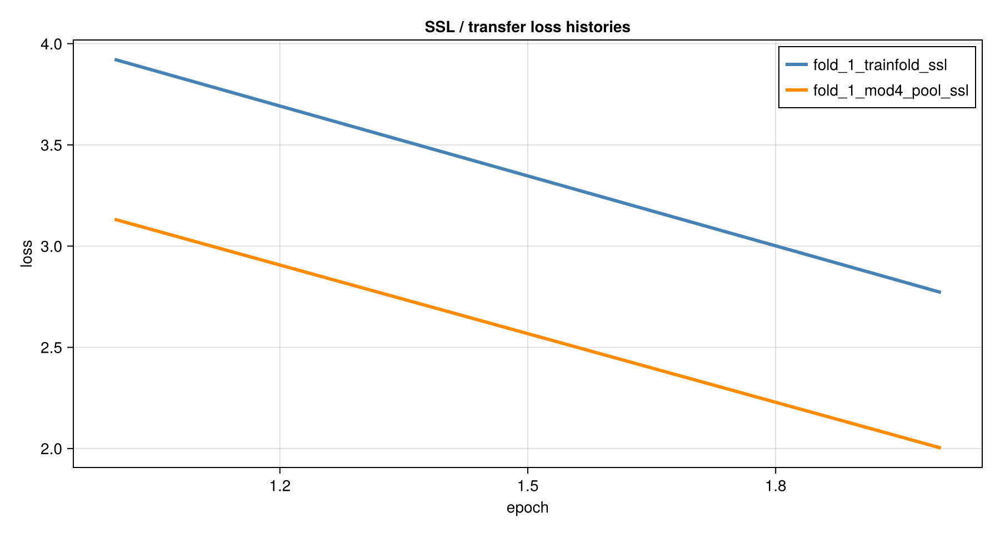

In [11]:
loss_fig = plot_ssl_loss_history(Dict(
    "fold_1_trainfold_ssl" => ssl_runs[(1, :trainfold)].loss_history,
    "fold_1_mod4_pool_ssl" => ssl_runs[(1, :mod4pool)].loss_history,
))

loss_fig


In [12]:
outputs_dir = joinpath(pwd(), "outputs")
mkpath(outputs_dir)

cv_csv_path = joinpath(outputs_dir, "semi_supervised_learing2_cv_results.csv")
summary_csv_path = joinpath(outputs_dir, "semi_supervised_learing2_summary.csv")
prediction_csv_path = joinpath(outputs_dir, "semi_supervised_learing2_predictions.csv")

CSV.write(cv_csv_path, ssl_cv_df)
CSV.write(summary_csv_path, summary_rank_df)
CSV.write(prediction_csv_path, ssl_prediction_df)

DataFrame(
    file = [cv_csv_path, summary_csv_path, prediction_csv_path],
    n_rows = [nrow(ssl_cv_df), nrow(summary_rank_df), nrow(ssl_prediction_df)],
)


Row,file,n_rows
,String,Int64
1,/home/benjamin/Dokumente/BA2/notebooks/week_18/outputs/semi_supervised_learing2_cv_results.csv,30
2,/home/benjamin/Dokumente/BA2/notebooks/week_18/outputs/semi_supervised_learing2_summary.csv,6
3,/home/benjamin/Dokumente/BA2/notebooks/week_18/outputs/semi_supervised_learing2_predictions.csv,3864


## Notes

- The default epoch counts are intentionally modest so the full workflow can be executed repeatedly without turning the notebook into a one-off long job.
- For longer training, increase `SSL_EPOCHS` first, then `FINETUNE_EPOCHS`, and only then the pseudo-label stage.
- The semi-supervised extension here follows the core idea from FixMatch / self-training literature: only keep confident pseudo-labels and use them as additional supervision.
- The most important comparison is whether the pseudo-label stage improves over the supervised baseline and over pure self-supervised fine-tuning.


## Predictions on Newly Unlabeled ERP Images

The Label Studio task files in `label_studio_data_unlabelled*` have now all been covered by the merged manual labels. To still inspect genuinely unlabeled ERP inputs, this section builds new candidates from channel / sort-variable combinations that are not present in the labeled table.

Important interpretation detail: these images do not have ground-truth labels, so this is not a measured accuracy evaluation. The tables and plots show prediction behaviour: predicted class, `p(pattern)`, and model confidence on unseen unlabeled ERP images.


In [13]:
unlabeled_ctx = build_unlabeled_candidate_dataset(
    ctx.data_ctx;
    target_size = IMAGE_SIZE,
    low_pass_sigma = LOWPASS_SIGMA,
    lowpass_kernel_size = LOWPASS_KERNEL_SIZE,
    filter_border = FILTER_BORDER,
    split_k = 4,
    max_channel = maximum(Int.(ctx.data_ctx.labels_df.channel_int)),
)

unlabeled_df = unlabeled_ctx.dataset_df

unlabeled_overview_df = DataFrame(
    n_unlabeled_mod4_images = [nrow(unlabeled_df)],
    n_unlabeled_channel_sort_groups = [length(unique(unlabeled_df.group_id))],
    n_channels = [length(unique(unlabeled_df.channel))],
    n_sort_variables = [length(unique(unlabeled_df.sort_var))],
)

unlabeled_sort_overview_df = combine(
    groupby(unlabeled_df, :sort_var),
    :group_id => (x -> length(unique(x))) => :n_channel_sort_groups,
    nrow => :n_mod4_images,
)
sort!(unlabeled_sort_overview_df, :sort_var)

(
    unlabeled_overview_df = unlabeled_overview_df,
    unlabeled_sort_overview_df = unlabeled_sort_overview_df,
)


(unlabeled_overview_df = 1×4 DataFrame
 Row │ n_unlabeled_mod4_images  n_unlabeled_channel_sort_groups  n_channels  n ⋯
     │ Int64                    Int64                            Int64       I ⋯
─────┼──────────────────────────────────────────────────────────────────────────
   1 │                     784                              196          39    ⋯
                                                                1 column omitted, unlabeled_sort_overview_df = 6×3 DataFrame
 Row │ sort_var          n_channel_sort_groups  n_mod4_images 
     │ String            Int64                  Int64         
─────┼────────────────────────────────────────────────────────
   1 │ duration                             32            128
   2 │ fix_avgpos_x                         32            128
   3 │ fix_avgpupilsize                     32            128
   4 │ fix_type                             34            136
   5 │ latency                              34            136
   6 │ sac_am

In [14]:
final_unlabeled_run = run_final_unlabeled_predictions(
    ctx.supervised_df,
    ctx.ssl_pool_df,
    unlabeled_df,
    ctx.X_supervised,
    ctx.y_binary;
    ssl_batchsize = SSL_BATCHSIZE,
    ssl_epochs = SSL_EPOCHS,
    ssl_lr = SSL_LR,
    ssl_temperature = SSL_TEMPERATURE,
    baseline_epochs = BASELINE_EPOCHS,
    baseline_lr = BASELINE_LR,
    probe_epochs = PROBE_EPOCHS,
    probe_lr = PROBE_LR,
    finetune_epochs = FINETUNE_EPOCHS,
    finetune_lr = FINETUNE_LR,
    pseudo_label_threshold = PSEUDO_LABEL_THRESHOLD,
    pseudo_label_min_keep = PSEUDO_LABEL_MIN_KEEP,
    pseudo_label_epochs = PSEUDO_LABEL_EPOCHS,
    pseudo_label_lr = PSEUDO_LABEL_LR,
    classifier_batchsize = CLASSIFIER_BATCHSIZE,
    image_size = IMAGE_SIZE,
    seed = EXPERIMENT_SEED + 50_000,
    show_epoch_logs = SHOW_EPOCH_LOGS,
)

unlabeled_prediction_df = final_unlabeled_run.prediction_df
unlabeled_summary_df = final_unlabeled_run.summary_df

select(
    unlabeled_summary_df,
    :experiment,
    :transfer_mode,
    :n_predictions,
    :predicted_pattern_n,
    :predicted_no_pattern_n,
    :predicted_pattern_rate,
    :prob_pattern_mean,
    :confidence_mean,
    :confidence_min,
    :confidence_max,
    :n_pseudo_selected,
)


Row,experiment,transfer_mode,n_predictions,predicted_pattern_n,predicted_no_pattern_n,predicted_pattern_rate,prob_pattern_mean,confidence_mean,confidence_min,confidence_max,n_pseudo_selected
,String,String,Int64,Int64,Int64,Float64,Float32,Float32,Float32,Float32,Int64
1,semi_ssl_pseudolabel_same_dataset_mod4_pool,pseudo_label_finetune,784,54,730,0.0688776,0.074284,0.964544,0.501394,0.999992,1264
2,ssl_finetune_same_dataset_mod4_pool,finetune,784,34,750,0.0433673,0.0572904,0.96409,0.504748,0.999999,0
3,supervised_resnet18,supervised,784,0,784,0.0,0.0647314,0.935269,0.605764,0.992496,0
4,ssl_finetune_trainfold_images,finetune,784,51,733,0.065051,0.101866,0.933889,0.501585,0.999765,0
5,ssl_linear_probe_trainfold_images,linear_probe,784,0,784,0.0,0.313358,0.686642,0.595588,0.815768,0
6,ssl_linear_probe_same_dataset_mod4_pool,linear_probe,784,62,722,0.0790816,0.358465,0.650119,0.500693,0.9251,0


In [15]:
unlabeled_prediction_csv_path = joinpath(outputs_dir, "semi_supervised_learing2_unlabeled_predictions.csv")
unlabeled_summary_csv_path = joinpath(outputs_dir, "semi_supervised_learing2_unlabeled_summary.csv")

CSV.write(unlabeled_prediction_csv_path, unlabeled_prediction_df)
CSV.write(unlabeled_summary_csv_path, unlabeled_summary_df)

DataFrame(
    file = [unlabeled_prediction_csv_path, unlabeled_summary_csv_path],
    n_rows = [nrow(unlabeled_prediction_df), nrow(unlabeled_summary_df)],
)


Row,file,n_rows
,String,Int64
1,/home/benjamin/Dokumente/BA2/notebooks/week_18/outputs/semi_supervised_learing2_unlabeled_predictions.csv,4704
2,/home/benjamin/Dokumente/BA2/notebooks/week_18/outputs/semi_supervised_learing2_unlabeled_summary.csv,6


## Unlabeled Confidence Plots

For every final model, the following plots show unique unlabeled ERP groups. Because no true labels exist here, the four rows are based on model predictions instead of ground truth:

- high confidence, predicted pattern
- low confidence, predicted pattern
- high confidence, predicted no pattern
- low confidence, predicted no pattern


In [16]:
unlabeled_plot_experiments = collect(unlabeled_summary_df.experiment)

unlabeled_example_tables = Dict{String, DataFrame}()
for experiment_name in unlabeled_plot_experiments
    selection = select_unlabeled_confidence_examples(unlabeled_prediction_df, experiment_name; n_per_bucket = 4)
    unlabeled_example_tables[experiment_name] = select(
        selection.selected_df,
        :bucket,
        :image_id,
        :channel,
        :sort_var,
        :split_part,
        :pred_label,
        :prob_pattern,
        :pred_confidence,
    )
end

unlabeled_example_tables


Dict{String, DataFrame} with 6 entries:
  "ssl_linear_probe_trainf… => 8×8 DataFrame…
  "ssl_finetune_trainfold_… => 16×8 DataFrame…
  "ssl_linear_probe_same_d… => 16×8 DataFrame…
  "ssl_finetune_same_datas… => 16×8 DataFrame…
  "supervised_resnet18"     => 8×8 DataFrame…
  "semi_ssl_pseudolabel_sa… => 16×8 DataFrame…

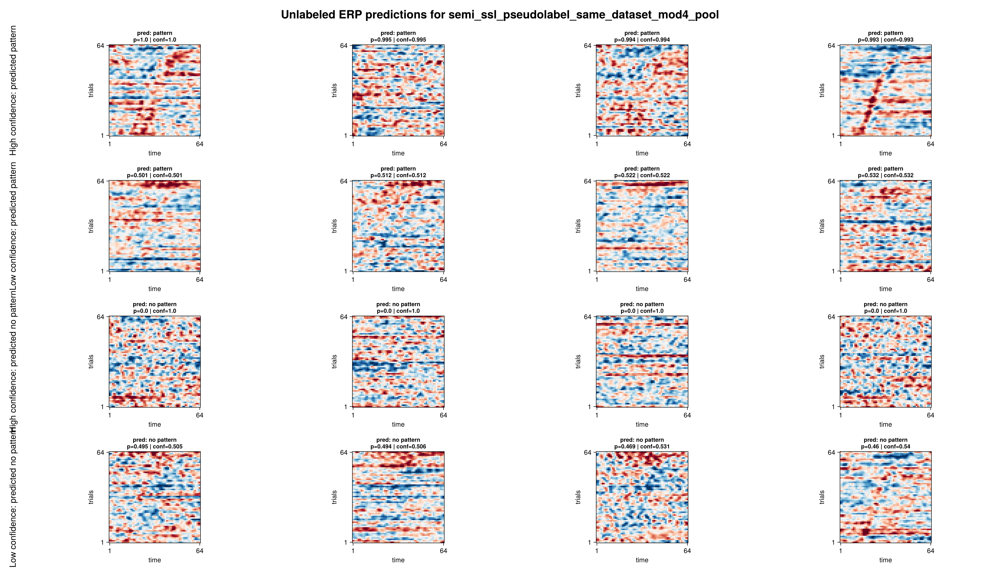

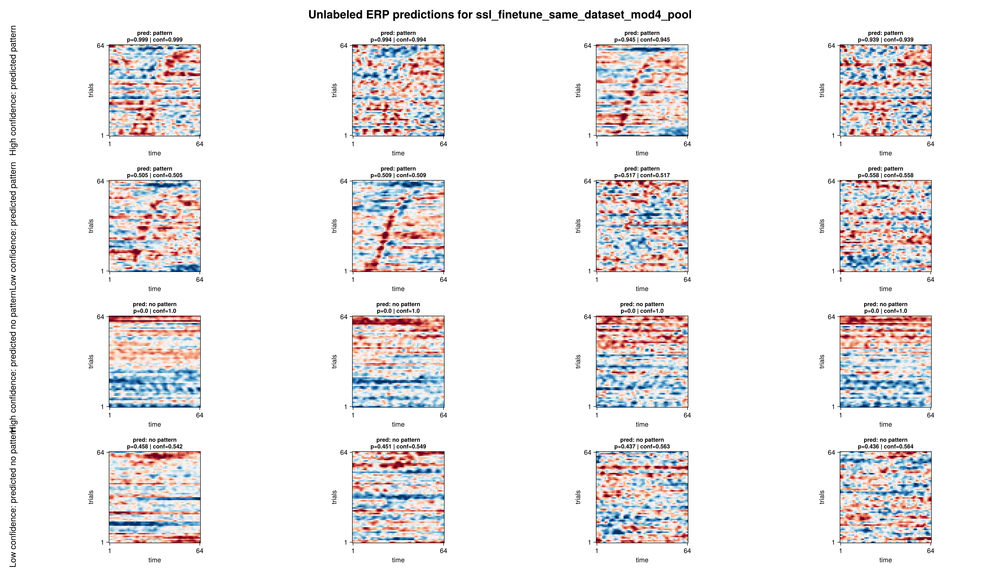

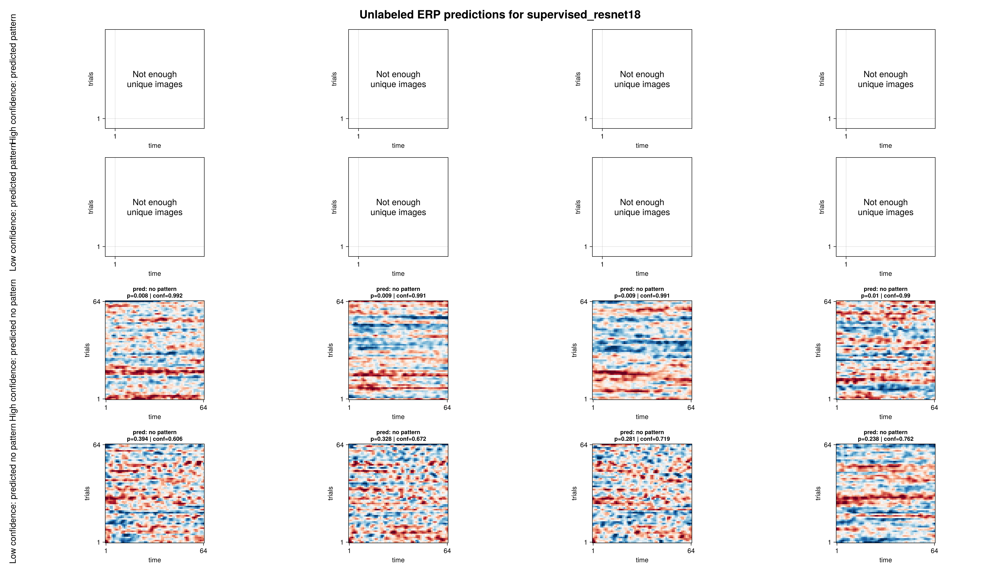

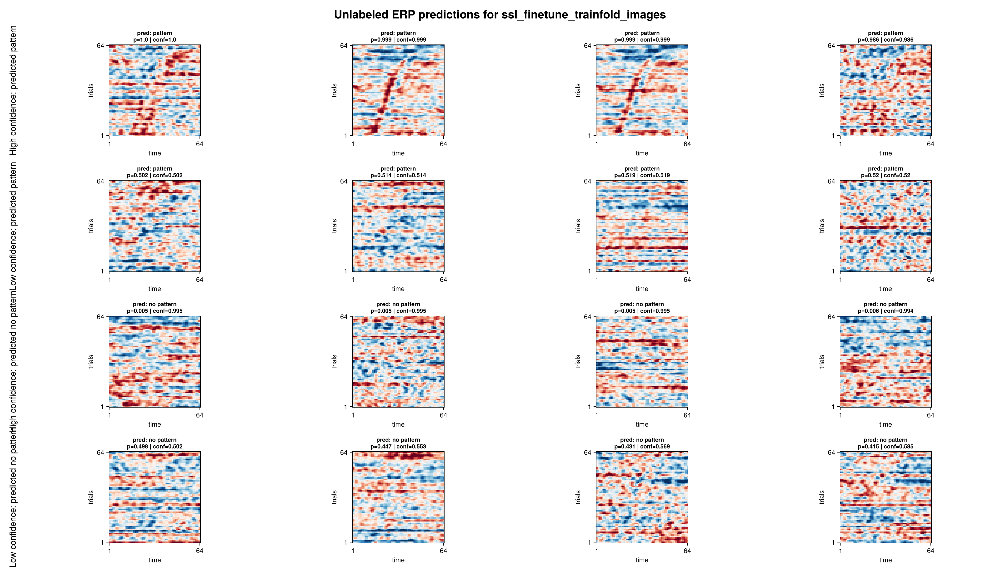

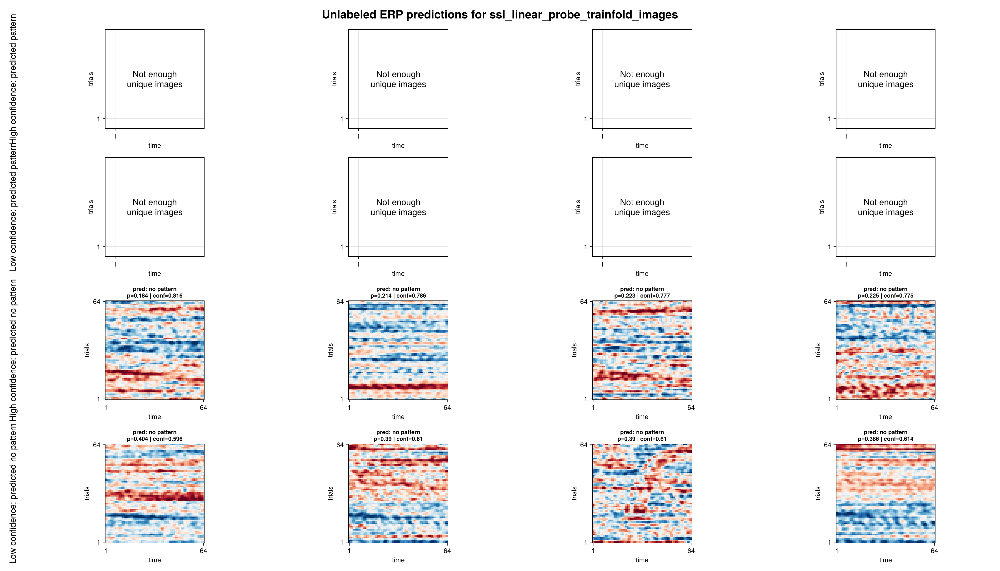

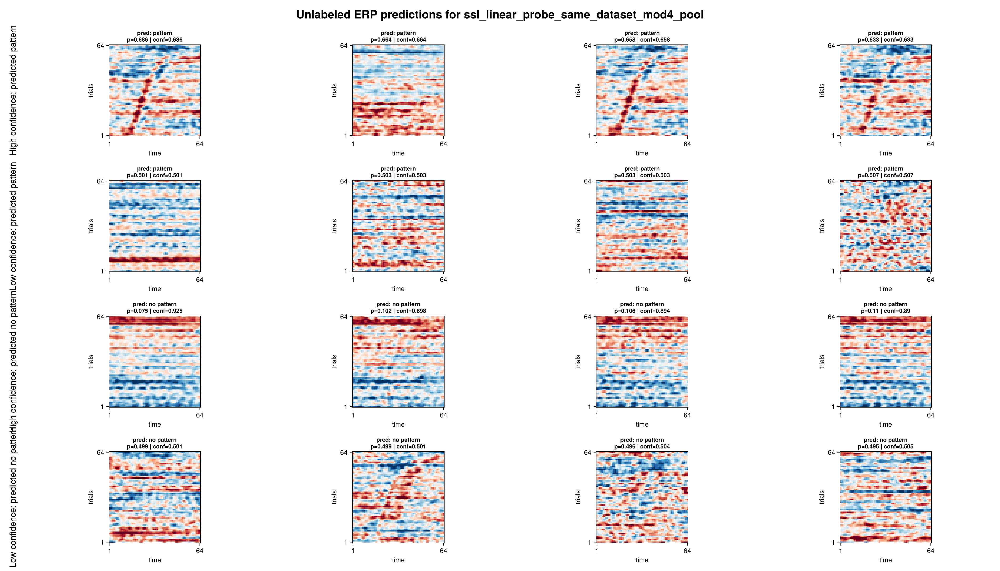

In [17]:
unlabeled_confidence_figures = Dict{String, Figure}()
for experiment_name in unlabeled_plot_experiments
    fig = plot_unlabeled_confidence_examples_grid(
        unlabeled_prediction_df,
        unlabeled_df,
        experiment_name;
        n_per_bucket = 4,
        figure_title = "Unlabeled ERP predictions for $(experiment_name)",
    )
    unlabeled_confidence_figures[experiment_name] = fig
    display(fig)
end

nothing
